# PRBM

In [1]:
import sympy as sm
import numpy as np


# Define Symbolic Variables
Gt, Lt, wt, tt = sm.symbols('G_t L_t w_t t_t', real=True)
kt_sym = (Gt / Lt) * (wt * tt**3 / 3)

# Define Numeric Values (Spring Steel)
Gt_val = 76.92e9  # Pa
Lt_val = 0.01      # m
wt_val = 0.01      # m
tt_val = 0.0003    # m (thickest)

# Substitute and Calculate
kt_calculated = kt_sym.subs({
    Gt: Gt_val, 
    Lt: Lt_val, 
    wt: wt_val, 
    tt: tt_val
})

kt_num = float(kt_calculated)

print("--- Torsional Stiffness Calculation ---")
print(f"Symbolic Equation: {kt_sym}")
print(f"Calculated Stiffness (k_t): {kt_num:.8f} Nm/rad")
print(f"Required Stiffness (from simulation): 1.0 Nm/rad")

--- Torsional Stiffness Calculation ---
Symbolic Equation: G_t*t_t**3*w_t/(3*L_t)
Calculated Stiffness (k_t): 0.69228000 Nm/rad
Required Stiffness (from simulation): 1.0 Nm/rad


In [2]:
kt_sym

G_t*t_t**3*w_t/(3*L_t)

In [3]:
import sympy as sm
import numpy as np
from sympy import pi

# --- 1. Define Symbolic Variables ---
t_flex, k_s, L_flex, N_beams, E, w_flex = sm.symbols('t_flex k_s L_flex N_beams E w_flex', real=True)

# --- 2. Define the Design Equation (based on lateral stiffness model) ---
# Note: The term (32/pi^2 - 1) is a common dimensionless factor used in compliant mechanism 
# literature (e.g., Howell) to relate transverse stiffness to the stiffness of the buckled structure.
C_factor = (32 / pi**2) - 1

# Equation to solve: k_s = [N * E * w * t^3] / [4 * L^3 * C_factor]
ks_eq = sm.Eq(k_s, (N_beams * E * w_flex * t_flex**3) / (4 * L_flex**3 * C_factor))

# Solve for thickness t_flex
ts_sol = sm.solve(ks_eq, t_flex)[0]

# --- 3. Define Numeric Values ---

# Material Properties (Spring Steel)
E_val = 200e9         # Young's Modulus (Pa)
nu_val = 0.30         # Poisson's Ratio

# Geometry and Stiffness (from previous steps)
ks_req_val = 300.0   # Required stiffness (N/m)
L_flex_val = 0.1      # Length (100 mm)
w_flex_val = 0.01     # Width/Height (10 mm)
N_beams_val = 2       # Number of parallel beams (Assumed)

# --- 4. Substitute and Calculate ---

t_flex_calculated = ts_sol.subs({
    E: E_val, 
    k_s: ks_req_val, 
    L_flex: L_flex_val, 
    w_flex: w_flex_val, 
    N_beams: N_beams_val
})

# Convert the symbolic result to a float number
t_flex_num = float(t_flex_calculated)
t_flex_mm = t_flex_num * 1000

print("--- Symbolic Equation for Flexure Thickness (t_flex) ---")
sm.pretty(ts_sol)
print("-" * 60)

print("--- Numeric Results (Spring Steel) ---")
print(f"Required Total Stiffness (k_s): {ks_req_val:.1f} N/m")
print(f"Flexure Length (L_flex): {L_flex_val*1000:.0f} mm")
print(f"Young's Modulus (E): {E_val/1e9:.0f} GPa")
print(f"Required Flexure Thickness (t_flex): {t_flex_mm:.3f} mm")
print("-" * 60)
print("This thickness ensures the buckled beam structure matches the required stiffness k_s.")

--- Symbolic Equation for Flexure Thickness (t_flex) ---
------------------------------------------------------------
--- Numeric Results (Spring Steel) ---
Required Total Stiffness (k_s): 300.0 N/m
Flexure Length (L_flex): 100 mm
Young's Modulus (E): 200 GPa
Required Flexure Thickness (t_flex): 0.876 mm
------------------------------------------------------------
This thickness ensures the buckled beam structure matches the required stiffness k_s.


In [4]:
ks_eq

Eq(k_s, E*N_beams*t_flex**3*w_flex/(4*L_flex**3*(-1 + 32/pi**2)))

### Full PRBM

In [5]:
import sympy as sm
from sympy.physics.mechanics import dynamicsymbols
import sympy.physics.mechanics as me
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Symbolic Definitions: All Links and Springs

# Symbols for the double slider mechanism
x6_sym, x6_0, r4_sym = sm.symbols('x6_sym x6_0 r4_sym', real=True)
k_sym, L0_sym, y_g = sm.symbols('k L0 y_g', real=True)

# Slider Spring Potential Energy
y_sym = y_g + sm.sqrt(r4_sym**2 - (x6_sym - x6_0)**2)
U_s_sym = sm.Rational(1, 2) * k_sym * (y_sym - L0_sym)**2

# Kinematic and Link Variables
theta1, theta2, theta3, theta7, theta8 = me.dynamicsymbols('theta1 theta2 theta3 theta7 theta8')
x6 = me.dynamicsymbols('x6')
r1, r2, r3, r7, r8 = sm.symbols('r1 r2 r3 r7 r8', real=True)
r9x, r9y = sm.symbols('r9x r9y', real=True)
y_g = sm.symbols('y_g', real=True)

# Reference Frames
N = me.ReferenceFrame('N')
A1 = me.ReferenceFrame('A1')
A2 = me.ReferenceFrame('A2')
A3 = me.ReferenceFrame('A3')
A7 = me.ReferenceFrame('A7')
A8 = me.ReferenceFrame('A8')

A1.orient_axis(N, N.z, theta1)
A2.orient_axis(N, N.z, theta2)
A3.orient_axis(N, N.z, theta3)
A7.orient_axis(N, N.z, theta7)
A8.orient_axis(N, N.z, theta8)

# Points
O = me.Point('O')
O.set_pos(O, 0 * N.x)

P1 = me.Point('P1')
P1.set_pos(O, r1 * A1.x)

P2 = me.Point('P2')
P2.set_pos(P1, r2 * A2.x)

P3 = me.Point('P3')
P3.set_pos(P2, r3 * A3.x)

Pg = me.Point('Pg')
Pg.set_pos(O, r9x * N.x + r9y * N.y)

P4 = me.Point('P4')
P4.set_pos(P2, r7 * A7.x)

# Torsional springs
k1, k2, k3, k4, k5, k6 = sm.symbols('k1 k2 k3 k4 k5 k6', real=True)
deltazero1, deltazero2, deltazero3, deltazero4, deltazero5, deltazero6 = sm.symbols(
    'deltazero1 deltazero2 deltazero3 deltazero4 deltazero5 deltazero6', real=True
)

U_t_sym = (
    sm.Rational(1, 2) * k1 * (theta2 - theta1 - deltazero1)**2 +
    sm.Rational(1, 2) * k2 * (theta3 - theta2 - deltazero2)**2 +
    sm.Rational(1, 2) * k3 * (theta7 - theta2 - deltazero3)**2 +
    sm.Rational(1, 2) * k4 * (theta8 - theta7 - deltazero4)**2 +
    sm.Rational(1, 2) * k5 * (theta8 - sm.Integer(0) - deltazero5)**2 +
    sm.Rational(1, 2) * k6 * (theta3 - sm.Integer(0) - deltazero6)**2
)

# Total Potential Energy
k_s, L0_s, r4_s, x6_0_s = sm.symbols('k_s L0_s r4_s x6_0_s', real=True)
U_s_mech_sym = U_s_sym.subs(
    {x6_sym: x6, k_sym: k_s, L0_sym: L0_s, r4_sym: r4_s, x6_0: x6_0_s, y_g: y_g}
)
U_total_sym = U_t_sym + U_s_mech_sym

# Symbolic Input Torque
M_in_sym = -sm.diff(U_total_sym, theta1)
M_in_sym_simplified = sm.simplify(M_in_sym)

# Kinematic Constraints

P3_rel = P3.pos_from(O)
eq_loop_x = sm.simplify(P3_rel.dot(N.x) - x6)
eq_loop_y = sm.simplify(P3_rel.dot(N.y) - y_g)

P4_rel = P4.pos_from(O)
eq_loop_2x = sm.simplify(P4_rel.dot(N.x) + r8 * sm.cos(theta8) - r9x)
eq_loop_2y = sm.simplify(P4_rel.dot(N.y) + r8 * sm.sin(theta8) - r9y)

# Numeric Parameter Setup

param_syms = [
    r1, r2, r3, r7, r8, r9x, r9y, y_g,
    k1, deltazero1,
    k2, deltazero2,
    k3, deltazero3,
    k4, deltazero4,
    k5, deltazero5,
    k6, deltazero6,
    k_s, L0_s, r4_s, x6_0_s
]

subs_dict_params = {
    r1: 0.15,
    r2: 0.4,
    r3: 0.6, #0.6
    y_g: 0.55,
    r7: 1.0,
    r8: 0.4,
    r9x: -1.0,
    r9y: 0.15,
    k_s: 200.0, # 200
    L0_s: 0.93, #move with y_g
    r4_s: 0.4,
    x6_0_s: 0.55,
    k1: 0,
    deltazero1: np.deg2rad(0),
    k2: 0.01,
    deltazero2: np.deg2rad(-90.0), # Checked
    k3: 0.45,
    deltazero3: np.deg2rad(90), # Checked, fixed guided
    k4: 0.0075,
    deltazero4: np.deg2rad(90), # Checked, fixed guided
    k5: 0.0075,
    deltazero5: np.deg2rad(-90), # Checked
    k6: 0.01,
    deltazero6: np.deg2rad(180.0),
}

U_total_const = U_total_sym.subs(subs_dict_params)
U_fun = sm.lambdify((theta1, theta2, theta3, x6, theta7, theta8), U_total_const, "numpy")

M_in_const = M_in_sym_simplified.subs(subs_dict_params)
M_in_fun = sm.lambdify((theta1, theta2, theta3, x6, theta7, theta8), M_in_const, "numpy")

eqs_all_const = [
    eq_loop_x.subs(subs_dict_params),
    eq_loop_y.subs(subs_dict_params),
    eq_loop_2x.subs(subs_dict_params),
    eq_loop_2y.subs(subs_dict_params),
]
C_fun = sm.lambdify((theta1, theta2, theta3, x6, theta7, theta8), eqs_all_const, "numpy")

# Slider bounds
x0_val = float(subs_dict_params[x6_0_s])
r4_val = float(subs_dict_params[r4_s])

def clip_x6(x):
    eps = 1e-6
    return np.clip(x, x0_val - r4_val + eps, x0_val + r4_val - eps)

# Coordinate Builder

P1x_sym = P1.pos_from(O).dot(N.x)
P1y_sym = P1.pos_from(O).dot(N.y)
P2x_sym = P2.pos_from(O).dot(N.x)
P2y_sym = P2.pos_from(O).dot(N.y)

P3x_sym = x6
P3y_sym = y_g

Pgx_sym = r9x
Pgy_sym = r9y

P4x_sym = P4.pos_from(O).dot(N.x)
P4y_sym = P4.pos_from(O).dot(N.y)

S4x_sym = x6_0_s
S4y_sym = y_g + sm.sqrt(r4_s**2 - (x6 - x6_0_s)**2)
S5x_sym = S4x_sym
S5y_sym = 2 * P3y_sym - S4y_sym

coordinates = sm.Matrix.hstack(
    sm.Matrix([[0], [0], [0]]),
    sm.Matrix([[P1x_sym], [P1y_sym], [0]]),
    sm.Matrix([[P2x_sym], [P2y_sym], [0]]),
    sm.Matrix([[P3x_sym], [P3y_sym], [0]]),
    sm.Matrix([[S4x_sym], [S4y_sym], [0]]),
    sm.Matrix([[S5x_sym], [S5y_sym], [0]]),
    sm.Matrix([[P4x_sym], [P4y_sym], [0]]),
    sm.Matrix([[Pgx_sym], [Pgy_sym], [0]]),
)

q_all = sm.Matrix([theta1, theta2, theta3, x6, theta7, theta8])
p_vec = sm.Matrix(param_syms)
eval_point_coords = sm.lambdify((q_all, p_vec), coordinates, "numpy")


# Potential Minimization Solver

def solve_for_stable_pos(theta1_val, guess):
    def objective(u):
        th2, th3, x6_val, th7, th8 = u
        x6_clipped = clip_x6(x6_val)
        return U_fun(theta1_val, th2, th3, x6_clipped, th7, th8)

    def constraints(u):
        th2, th3, x6_val, th7, th8 = u
        return C_fun(theta1_val, th2, th3, x6_val, th7, th8)

    bounds = [
        (-2*np.pi, 2*np.pi),
        (-2*np.pi, 2*np.pi),
        (x0_val - r4_val, x0_val + r4_val),
        (-2*np.pi, 2*np.pi),
        (-2*np.pi, 2*np.pi),
    ]

    res_min = minimize(
        objective,
        guess,
        method='SLSQP',
        constraints=[{'type': 'eq', 'fun': constraints}],
        bounds=bounds,
        tol=1e-8
    )

    if not res_min.success:
        raise RuntimeError(f"Minimization failed at theta1={theta1_val:.3f}: {res_min.message}")

    return res_min.x.tolist()

# Continuation Loop with Energy Comparison for Snapping

theta_vals = np.linspace(0, -2*np.pi, 180)
x_coords_list = []
y_coords_list = []
x6_vals_stable = []

M_in_vals = []
dtheta = 1e-4

last_stable_guess = [
    np.deg2rad(60.697406),     # theta2
    np.deg2rad(-65.086306),    # theta3
    0.5,                      # x6 (unchanged)
    np.deg2rad(180.0),        # theta7
    np.deg2rad(-119.302594),  # theta8
]

p_vals = np.array([float(subs_dict_params[s]) for s in p_vec], dtype=float)

for th1 in theta_vals:
    guess_A = last_stable_guess

    guess_B = np.array(last_stable_guess, dtype=float).copy()
    guess_B[2] = 2.0 * x0_val - guess_B[2]

    sol_A, U_A = None, np.inf
    try:
        sol_A = solve_for_stable_pos(th1, guess_A)
        U_A = U_fun(th1, *sol_A)
    except RuntimeError:
        pass

    sol_B, U_B = None, np.inf
    try:
        sol_B = solve_for_stable_pos(th1, guess_B)
        U_B = U_fun(th1, *sol_B)
    except RuntimeError:
        pass

    sol = None
    if U_A < U_B:
        sol = sol_A
    elif U_B < U_A:
        sol = sol_B

    if sol is None:
        x_coords_list.append(np.full(8, np.nan))
        y_coords_list.append(np.full(8, np.nan))
        x6_vals_stable.append(np.nan)
        M_in_vals.append(np.nan)
        continue

    last_stable_guess = sol
    x6_vals_stable.append(sol[2])

    q_vals = np.array([float(th1)] + sol, dtype=float)
    coords = eval_point_coords(q_vals, p_vals)
    x_coords_list.append(np.array(coords[0, :], dtype=float))
    y_coords_list.append(np.array(coords[1, :], dtype=float))

    th1_plus = th1 + dtheta
    try:
        sol_plus = solve_for_stable_pos(th1_plus, sol)
        U_plus = U_fun(th1_plus, *sol_plus)
        U_minus = U_fun(th1, *sol)
        M_in_val = - (U_plus - U_minus) / dtheta
        M_in_vals.append(float(M_in_val))
    except RuntimeError:
        M_in_vals.append(np.nan)

x_coords = np.vstack(x_coords_list)
y_coords = np.vstack(y_coords_list)
M_in_vals = np.array(M_in_vals)

res = {
    "theta_vals": theta_vals,
    "x_coords": x_coords,
    "y_coords": y_coords,
    "M_in_vals": M_in_vals
}


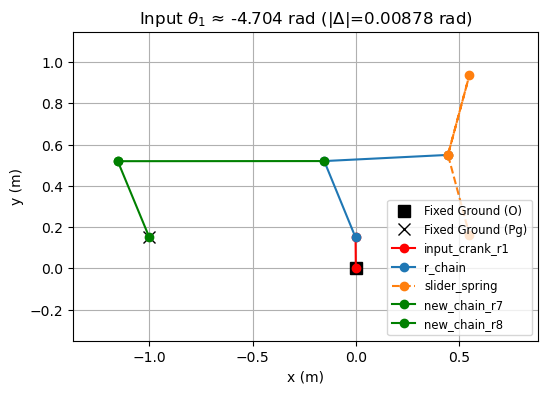

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# indices in coordinates: [O, P1, P2, P3, S4, S5, P4, Pg]
IDX_O  = 0
IDX_P1 = 1
IDX_P2 = 2
IDX_P3 = 3
IDX_S4 = 4
IDX_S5 = 5
IDX_P4 = 6
IDX_PG = 7

link_defs = {
    "input_crank_r1": [IDX_O, IDX_P1],
    "r_chain": [IDX_P1, IDX_P2, IDX_P3],
    "slider_spring": [IDX_P3, IDX_S4, IDX_P3, IDX_S5],
    "new_chain_r7": [IDX_P2, IDX_P4],
    "new_chain_r8": [IDX_P4, IDX_PG],
}

def plot_single_pose(theta_target, theta_vals, x_coords, y_coords, tol=None, figsize=(6, 6)):
    """
    Plot one mechanism configuration at a chosen input angle theta_target.
    Assumes x_coords and y_coords are already computed for each theta in theta_vals.

    Parameters
    ----------
    theta_target : float
        Desired input angle [rad]
    theta_vals : array-like
        Array of input angles corresponding to rows in x_coords/y_coords
    x_coords, y_coords : ndarray
        Shape (N, 8) arrays with point coordinates
    tol : float or None
        Optional tolerance. If provided, raises if nearest theta is farther than tol.
    figsize : tuple
        Matplotlib figure size
    """
    theta_vals = np.asarray(theta_vals, dtype=float)
    i = int(np.nanargmin(np.abs(theta_vals - float(theta_target))))
    err = float(np.abs(theta_vals[i] - float(theta_target)))

    if tol is not None and err > tol:
        raise ValueError(f"Nearest theta is {theta_vals[i]:.6f} rad (error {err:.6f} rad) > tol={tol}.")

    x = np.asarray(x_coords[i, :], dtype=float)
    y = np.asarray(y_coords[i, :], dtype=float)

    fig, ax = plt.subplots(figsize=figsize)

    # Fixed ground points
    ax.plot([x[IDX_O]],  [y[IDX_O]],  "ks", markersize=8, label="Fixed Ground (O)")
    ax.plot([x[IDX_PG]], [y[IDX_PG]], "kx", markersize=8, label="Fixed Ground (Pg)")

    if np.any(np.isnan(x)) or np.any(np.isnan(y)):
        ax.set_title(f"Input $\\theta_1$ ≈ {theta_vals[i]:.3f} rad (invalid pose)")
    else:
        for name, idx_list in link_defs.items():
            xs = [x[j] for j in idx_list]
            ys = [y[j] for j in idx_list]

            if name == "slider_spring":
                ax.plot(xs, ys, "o--", markersize=6, label=name)
            elif name.startswith("new_chain"):
                ax.plot(xs, ys, "o-g", markersize=6, label=name)
            elif name == "input_crank_r1":
                ax.plot(xs, ys, "o-r", markersize=6, label=name)
            else:
                ax.plot(xs, ys, "o-", markersize=6, label=name)

        ax.set_title(f"Input $\\theta_1$ ≈ {theta_vals[i]:.3f} rad (|Δ|={err:.3g} rad)")

    # Nice view limits
    x_min = np.nanmin(x_coords) - 0.2
    x_max = np.nanmax(x_coords) + 0.2
    y_min = np.nanmin(y_coords) - 0.2
    y_max = np.nanmax(y_coords) + 0.2

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_aspect("equal")
    ax.grid(True)
    ax.set_xlabel("x (m)")
    ax.set_ylabel("y (m)")
    ax.legend(loc="best", fontsize="small")
    plt.savefig("mechanism_pose.png", dpi=300, bbox_inches="tight")

    plt.show()
    return i

# Example usage:
idx = plot_single_pose(theta_target=np.deg2rad(-270), theta_vals=theta_vals, x_coords=x_coords, y_coords=y_coords, tol=0.05)


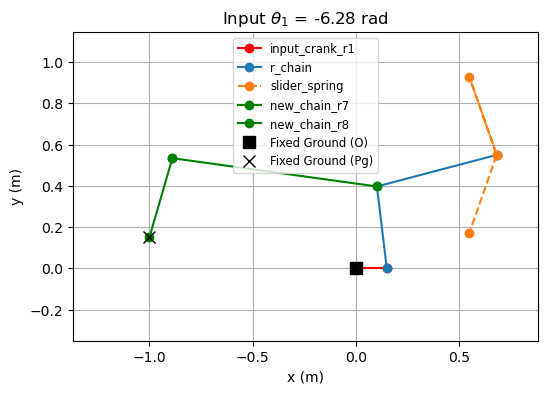

In [7]:
# --- VI. Visualization (FuncAnimation) ---

## 🎥 Bistable Mechanism Animation

# indices in coordinates: [O, P1, P2, P3, S4, S5, P4, Pg]
IDX_O  = 0
IDX_P1 = 1
IDX_P2 = 2
IDX_P3 = 3
IDX_S4 = 4
IDX_S5 = 5
IDX_P4 = 6 # New moving point
IDX_PG = 7 # New fixed ground point

fig, ax = plt.subplots(figsize=(6, 6))

# Structured definition of which links to draw
link_defs = {
    # 🌟 FIX: ADD INPUT CRANK r1 (O to P1) 🌟
    "input_crank_r1": [IDX_O, IDX_P1],      # r1 (Input crank: Ground to P1)
    
    # r2, r3 (Moving links of the bistable chain)
    "r_chain": [IDX_P1, IDX_P2, IDX_P3], 
    
    "slider_spring": [IDX_P3, IDX_S4, IDX_P3, IDX_S5], # S4/S5 bistable linkage
    
    # r7 is P2->P4, r8 is P4->Pg.
    "new_chain_r7": [IDX_P2, IDX_P4],      # r7 (Moving link)
    "new_chain_r8": [IDX_P4, IDX_PG],      # r8 (Moving link connecting to fixed point Pg)
}

# create one Line2D per link
lines = {}
for name in link_defs:
    style = "o-" 
    if name == "slider_spring":
        style = "o--" # Dashed for virtual spring links
    elif name.startswith("new_chain"):
        style = "o-g" # Green for the new 4-bar moving links
    elif name == "input_crank_r1":
        style = "o-r" # Red for the input crank
    
    line, = ax.plot([], [], style, markersize=6, label=name)
    lines[name] = line

# Add fixed ground points (O and Pg) as separate, simple markers
line_fixed_O, = ax.plot([], [], 'ks', markersize=8, label='Fixed Ground (O)')
line_fixed_PG, = ax.plot([], [], 'kx', markersize=8, label='Fixed Ground (Pg)')
lines['fixed_O'] = line_fixed_O
lines['fixed_PG'] = line_fixed_PG

# axis limits from data with margin
x_min = np.nanmin(x_coords) - 0.2
x_max = np.nanmax(x_coords) + 0.2
y_min = np.nanmin(y_coords) - 0.2
y_max = np.nanmax(y_coords) + 0.2

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_aspect("equal")
ax.grid(True)
ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")
ax.legend(loc="best", fontsize='small')

def init():
    for line in lines.values():
        line.set_data([], [])
    
    # Initialize fixed points once
    line_fixed_O.set_data([x_coords[0, IDX_O]], [y_coords[0, IDX_O]])
    line_fixed_PG.set_data([x_coords[0, IDX_PG]], [y_coords[0, IDX_PG]])
    
    return tuple(lines.values())

def animate(i):
    x = x_coords[i, :]
    y = y_coords[i, :]

    if np.any(np.isnan(x)) or np.any(np.isnan(y)):
        for name, line in lines.items():
            if not name.startswith('fixed'):
                line.set_data([], [])
        ax.set_title(f"Input $\\theta_1$ = {theta_vals[i]:.2f} rad (UNSTABLE: SNAP OCCURRING)")
        return tuple(lines.values())

    # Update each link from its point index list
    for name, idx_list in link_defs.items():
        # Correctly extract coordinates using the index j from the loop over idx_list
        xs = [x[j] for j in idx_list]
        ys = [y[j] for j in idx_list] 
        
        lines[name].set_data(xs, ys)

    ax.set_title(f"Input $\\theta_1$ = {theta_vals[i]:.2f} rad")
    return tuple(lines.values())

ani = FuncAnimation(
    fig,
    animate,
    frames=len(theta_vals),
    init_func=init,
    interval=40,
    blit=True
)

# ... [Previous code ends with the definition of 'ani'] ...

# Display the animation (optional, but keeps the notebook display working)
HTML(ani.to_jshtml(fps=30))

# # --- ADD THIS BLOCK TO SAVE THE VIDEO ---

# # Define the file name and the frames per second (fps)
# filename = 'bistable_mechanism_snap.mp4'
# video_fps = 30 

# print(f"Saving animation to {filename}...")

# try:
#     # Use the save method. Writer='ffmpeg' is the default for mp4.
#     ani.save(
#         filename, 
#         fps=video_fps, 
#         extra_args=['-vcodec', 'libx264'], 
#         dpi=150 # Higher DPI (dots per inch) improves video quality
#     )
#     print("Video successfully saved!")
    
# except ValueError as e:
#     # This often catches the case where FFmpeg is not found.
#     if 'must have a MovieWriter set' in str(e):
#         print("\nERROR: Matplotlib MovieWriter (FFmpeg) not found!")
#         print("Please ensure FFmpeg is installed and accessible in your system PATH.")
#     else:
#         print(f"\nAn error occurred during saving: {e}")

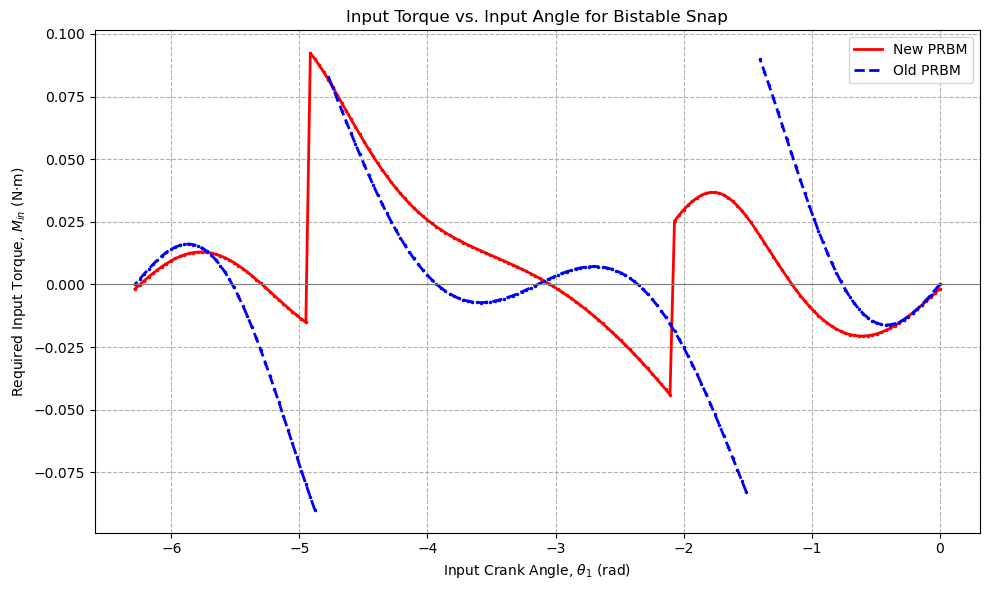

In [35]:
# --- PLOTTING BLOCK: Input Torque vs. Input Angle (NEW vs OLD) ---

def filter_snap(theta_vals, M_vals):
    """
    Filter torque data to visually break the curve at snap events.
    """
    M_plot = M_vals.copy()
    theta_plot = theta_vals.copy()

    valid = M_plot[~np.isnan(M_plot)]
    if len(valid) < 5:
        return theta_plot, M_plot

    jump_thresh = 5 * np.std(valid)

    for i in range(1, len(M_plot)):
        if np.isnan(M_plot[i]):
            if not np.isnan(M_plot[i-1]):
                M_plot[i-1] = np.nan
            continue

        if np.abs(M_plot[i] - M_plot[i-1]) > jump_thresh:
            M_plot[i-1] = np.nan
            M_plot[i] = np.nan

    return theta_plot, M_plot


# --- NEW DESIGN ---
theta_new = res["theta_vals"].copy()
M_new = res["M_in_vals"].copy()
theta_new_f, M_new_f = filter_snap(theta_new, M_new)

# --- OLD DESIGN ---
theta_old = res_old["theta_vals"].copy()
M_old = res_old["M_in_vals"].copy()
theta_old_f, M_old_f = filter_snap(theta_old, M_old)


plt.figure(figsize=(10, 6))

# New design
plt.plot(theta_new_f, M_new_f, 'r-', linewidth=2, label='New PRBM')
plt.plot(theta_new_f, M_new_f, 'r.', markersize=3)

# Old design
plt.plot(theta_old_f, M_old_f, 'b--', linewidth=2, label='Old PRBM')
plt.plot(theta_old_f, M_old_f, 'b.', markersize=3)

plt.title('Input Torque vs. Input Angle for Bistable Snap')
plt.xlabel(r'Input Crank Angle, $\theta_1$ (rad)')
plt.ylabel(r'Required Input Torque, $M_{in}$ (N·m)')
plt.grid(True, linestyle='--')
plt.axhline(0, color='gray', linewidth=0.8)
plt.legend()
plt.tight_layout()
plt.show()


# --- EXPORT FILTERED DATA ---
import pandas as pd

export_df = pd.DataFrame({
    "theta": theta_new_f,
    "M_new": M_new_f,
    "M_old": M_old_f
})

export_df.to_csv("theta_M_new_M_old_filtered.csv", index=False)



In [20]:
import numpy as np

def solve_initial_configuration(theta1_val, guess=None):
    """
    Solves the constrained minimum-energy configuration for a single given theta1,
    then returns the solved generalized coordinates and all relative joint angles.

    Returns
    -------
    sol : dict
        Contains solved angles and slider coordinate:
        theta1, theta2, theta3, theta7, theta8, x6
    rel : dict
        Contains relative angles (link-to-link):
        r2_vs_r1, r3_vs_r2, r7_vs_r2, r8_vs_r7, r8_vs_ground
    """
    if guess is None:
        # [theta2, theta3, x6, theta7, theta8]
        guess = [np.deg2rad(45), np.deg2rad(-45), 0.6, np.deg2rad(180), np.deg2rad(0)]

    sol_list = solve_for_stable_pos(theta1_val, guess)
    th2, th3, x6_val, th7, th8 = sol_list

    sol = {
        "theta1": float(theta1_val),
        "theta2": float(th2),
        "theta3": float(th3),
        "theta7": float(th7),
        "theta8": float(th8),
        "x6": float(x6_val),
    }

    rel = {
        "r2_vs_r1 (theta2-theta1)": float(th2 - theta1_val),
        "r3_vs_r2 (theta3-theta2)": float(th3 - th2),
        "r7_vs_r2 (theta7-theta2)": float(th7 - th2),
        "r8_vs_r7 (theta8-theta7)": float(th8 - th7),
        "r8_vs_ground (theta8-0)": float(th8),
    }

    return sol, rel


import numpy as np

def print_initial_torsion_angles(theta1_val, guess=None, degrees=True, wrap_to_pi=True):
    """
    Solves the initial configuration for a given theta1 and prints
    the absolute and relative joint angles.
    """
    if guess is None:
        # [theta2, theta3, x6, theta7, theta8]
        guess = [
    np.deg2rad(60.697406),     # theta2
    np.deg2rad(-65.086306),    # theta3
    0.6,                      # x6 (unchanged)
    np.deg2rad(180.0),        # theta7
    np.deg2rad(-119.302594),  # theta8
]


    sol = solve_for_stable_pos(theta1_val, guess)
    th2, th3, x6_val, th7, th8 = sol

    def wrap(a):
        if not wrap_to_pi:
            return a
        return (a + np.pi) % (2*np.pi) - np.pi

    conv = 180.0 / np.pi if degrees else 1.0
    unit = "deg" if degrees else "rad"

    # Print absolute angles
    print("Initial absolute angles:")
    print(f"theta1 = {theta1_val * conv:.6f}{unit}")
    print(f"theta2 = {th2 * conv:.6f}{unit}")
    print(f"theta3 = {th3 * conv:.6f}{unit}")
    print(f"theta7 = {th7 * conv:.6f}{unit}")
    print(f"theta8 = {th8 * conv:.6f}{unit}")
    print("")

    # Relative torsional angles
    angles = {
        "k1 initial has (theta2 - theta1)": th2 - theta1_val,
        "k2 initial has (theta3 - theta2)": th3 - th2,
        "k3 initial has (theta7 - theta2)": th7 - th2,
        "k4 initial has (theta8 - theta7)": th8 - th7,
        "k5 initial has (theta8 - 0)": th8,
    }

    print("Initial torsional angles:")
    for label, val in angles.items():
        print(f"{label} = {wrap(val) * conv:.6f}{unit}")

    return angles


# Example usage
# theta1_val = np.deg2rad(90)
# print_initial_torsion_angles(theta1_val, degrees=True)




In [21]:
theta1_val = np.deg2rad(90)

print_initial_torsion_angles(
    theta1_val=theta1_val,
    degrees=True
)


Initial absolute angles:
theta1 = 90.000000deg
theta2 = 81.646513deg
theta3 = 0.405253deg
theta7 = 180.000000deg
theta8 = -98.353487deg

Initial torsional angles:
k1 initial has (theta2 - theta1) = -8.353487deg
k2 initial has (theta3 - theta2) = -81.241261deg
k3 initial has (theta7 - theta2) = 98.353487deg
k4 initial has (theta8 - theta7) = 81.646513deg
k5 initial has (theta8 - 0) = -98.353487deg


{'k1 initial has (theta2 - theta1)': np.float64(-0.1457958494118008),
 'k2 initial has (theta3 - theta2)': -1.4179274869501473,
 'k3 initial has (theta7 - theta2)': 1.716592176206593,
 'k4 initial has (theta8 - theta7)': -4.85818482979459,
 'k5 initial has (theta8 - 0)': -1.716592176204901}

In [22]:
# --- 2. Define the Design Equation (fixed–fixed buckled beam, Eq. 6) ---

# Design symbols
t_flex = sm.symbols('t_flex', positive=True, real=True)

# Given geometric / operating parameters
delta_z, Y0 = sm.symbols('delta_z Y0', positive=True, real=True)

# Second moment of area
I_flex = w_flex * t_flex**3 / 12

# Fixed–fixed Euler load
P_fix = 4 * sm.pi**2 * E * I_flex / L_flex**2

# Eq. (6) vertical stiffness for ONE beam
kz_single = P_fix * (
    1 / (2 * L_flex * (1 - delta_z / (2 * L_flex))**2)
    + sm.pi * Y0 / (4 * sm.sqrt(L_flex * delta_z**3))
)

# Parallel beams
kz_total = N_beams * kz_single

# Design equation: k_s = kz_total
ks_eq = sm.Eq(k_s, kz_total)

# Solve for thickness
t_sol = sm.solve(ks_eq, t_flex)[0]

# --- 3. Numeric Values ---

E_val = 200e9           # Pa
ks_req_val = 200.0      # N/m
L_flex_val = 0.05        # m
w_flex_val = 0.01       # m
N_beams_val = 4

# Buckling state parameters (must be chosen)
delta_z_val = 0.004     # m (post-buckling shortening)
Y0_val = 2.7e-4         # m (initial imperfection)

# Substitute values
t_val = float(
    t_sol.subs({
        E: E_val,
        k_s: ks_req_val,
        L_flex: L_flex_val,
        w_flex: w_flex_val,
        N_beams: N_beams_val,
        delta_z: delta_z_val,
        Y0: Y0_val
    })
)

print(f"Required flexure thickness t = {t_val*1e3:.3f} mm")


Required flexure thickness t = 0.109 mm


In [23]:
# Example use cases of the small-length flexural pivot torsional stiffness
# for thicknesses 0.1 mm, 0.2 mm, and 0.3 mm

# Material and geometry (example values)
E = 200e9      # Young's modulus [Pa] (spring steel)
l = 0.01       # flexure length [m] (10 mm)
w = 0.01       # flexure width [m] (10 mm)

def torsional_stiffness_small_flexure(E, l, w, t):
    I = w * t**3 / 12.0
    K = E * I / l
    return K

def torsional_stiffness_fixed_guided(E, l, w, t, gamma=0.85, Kpp=2.65):
    I = w * t**3 / 12.0
    K = 2.0 * gamma * Kpp * E * I / l
    return K


# Thickness sweep
thicknesses = [0.1e-3, 0.2e-3, 0.3e-3]

for t in thicknesses:
    K = torsional_stiffness_small_flexure(E, l, w, t)
    print(f"t = {t*1e3:.1f} mm -> K = {K:.4f} N·m/rad")

t = 0.1e-3
l_r8_flexure = 0.1 # flexure length [m] (100 mm)
K = torsional_stiffness_fixed_guided(E, l_r8_flexure, w, t)
print(f"t = {t*1e3:.1f} mm -> K = {K:.4f} N·m/rad")


t = 0.1 mm -> K = 0.0167 N·m/rad
t = 0.2 mm -> K = 0.1333 N·m/rad
t = 0.3 mm -> K = 0.4500 N·m/rad
t = 0.1 mm -> K = 0.0075 N·m/rad
